In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

$$
w(x,t) = w_{\text{static}}(x) + w_{\text{dynamic}}(x,t)
$$

$$
w_{\text{static}}(x) = \frac{mg}{6EI}(-x^3 + 3Lx^2)
$$

$$
w_{\text{dynamic}}(x,t) = \phi_1(x)\left[A_1\cos(\omega_1 t) + B_1\sin(\omega_1 t)\right]
$$

In [2]:
# Параметры системы
L = 1.0  # длина балки
EI = 1e8  # жесткость 
m = 0.01  # масса грузика 
g = 9.81
rho = 0.1  # плотность балки
A = 0.001  # площадь поперечного сечения 
M = rho * A * L  # итоговая масса балки 
Meff = 0.236 * M  # эффективная масса балки в первой моде

freq = 440  # камертон 440 Гц
omega_1 = 2 * np.pi * freq  # угловая частота (рад/с)

In [3]:
period = 1 / freq
t = np.linspace(0, 5 * period, 300)  # 5 периодов колебаний

In [4]:
A1 = 0.001  # Амплитуда
B1 = 0

In [5]:
def phi1(x):
    return 1 - np.cos(np.pi * x / (2 * L))

In [6]:
def w_static(x):
    return (m * g / (6 * EI)) * (-x ** 3 + 3 * L * x ** 2)

In [7]:
X = np.linspace(0, L, 100)
T, Xgrid = np.meshgrid(t, X)

In [8]:
W_stat = w_static(Xgrid)

In [9]:
W_dyn = phi1(Xgrid) * (A1 * np.cos(omega_1 * T) + B1 * np.sin(omega_1 * T))

W = W_stat + W_dyn

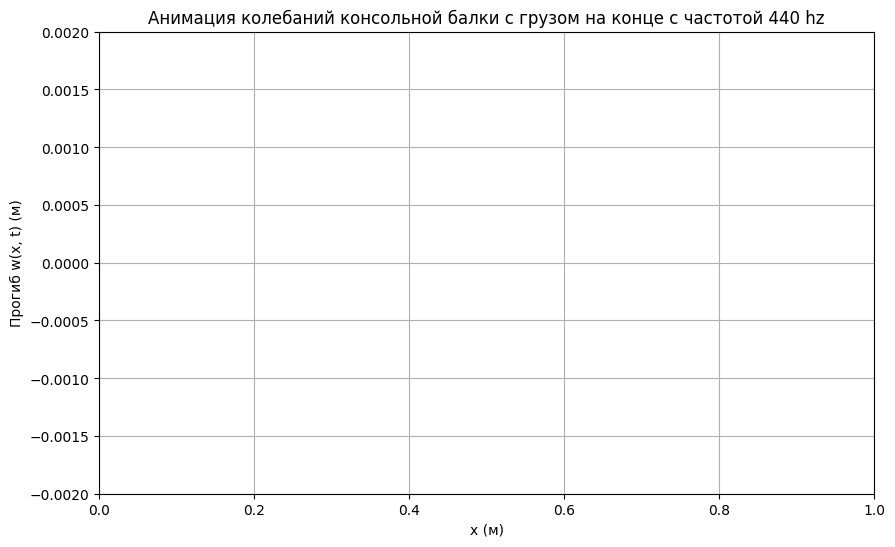

In [10]:
fig, ax = plt.subplots(figsize=(10, 6))
line, = ax.plot([], [], 'b-', linewidth=2)
ax.set_xlim(0, L)
ax.set_ylim(-0.002, 0.002)
ax.set_title("Анимация колебаний консольной балки с грузом на конце с частотой 440 hz")
ax.set_xlabel("x (м)")
ax.set_ylabel("Прогиб w(x, t) (м)")
ax.grid(True)

# грузик
mass_marker, = ax.plot([], [], 'ro', markersize=10)


# Функция инициализации
def init():
    line.set_data([], [])
    mass_marker.set_data([], [])
    return line, mass_marker


# Функция анимации
def animate(i):
    line.set_data(X, W[:, i])
    mass_marker.set_data(L, W[-1, i])  # Положение груза на конце
    ax.set_title(f"Колебания балки (t = {t[i]:.2f} c)")
    return line, mass_marker


# Создание анимации
ani = FuncAnimation(fig, animate, frames=len(t),
                    init_func=init, blit=True, interval=20)


In [11]:
from IPython.display import HTML

HTML(ani.to_jshtml())

D:\Users\Boris\AppData\Local\Temp\ipykernel_1780\3494678477.py:24: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  mass_marker.set_data(L, W[-1, i])  # Положение груза на конце
